## Problem Statement:
IN THE FIELD OF PARTICLE PHYSICS, ACCURATE
IDENTIFICATION AND CLASSIFICATION OF EVENTS ARE
CRUCIAL FOR UNDERSTANDING FUNDAMENTAL PARTICLES
AND THEIR INTERACTIONS. THE PROVIDED DATASET
CONTAINS VARIOUS FEATURES DERIVED FROM PARTICLE
PHYSICS EXPERIMENTS, AND THE GOAL IS TO BUILD A
MACHINE-LEARNING MODEL TO CLASSIFY EVENTS INTO
SIGNAL (s) AND BACKGROUND (b) CATEGORIES. THIS
CLASSIFICATION AIDS IN DISTINGUISHING EVENTS OF
INTEREST (SIGNAL) FROM BACKGROUND NOISE.

## Objective:
The primary goal of this machine learning project is to develop
a model that can accurately predict whether a given set of
experimental features corresponds to a signal or background
event. Successful classification contributes to the advancement
of particle physics research by automating the identification of
events that may indicate the presence of specific particles or
phenomena.

## Importing required Libraries:

In [18]:
import numpy as np
import pandas as pd
from datetime import datetime, timedelta
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# setting options to show maximum of row and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

# disabling Warnings
import warnings
warnings.filterwarnings("ignore")

## Importing Datasets:

In [19]:
df=pd.read_csv('Data.csv')
df.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,197.760,1.582,1.396,0.2,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,125.157,0.879,1.414,-999.0,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,197.814,3.776,1.414,-999.0,32.154,-0.705,-2.093,121.409,-0.953,1.052,54.283,-2.186,260.414,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,9.00,-999.000,-999.000,3.310,0.414,75.968,2.354,-1.285,-999.0,22.647,-1.655,0.010,53.321,-0.522,-3.100,31.082,0.060,86.062,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,57.983,1.056,-1.385,-999.0,28.209,-2.197,-2.231,29.774,0.798,1.569,2.723,-0.871,53.131,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [3]:
df.sample(5)

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
184079,284079,117.712,41.397,86.570,37.324,-999.000,-999.000,-999.000,2.670,12.900,127.456,0.496,-1.402,-999.000,59.867,0.031,-2.566,29.671,-0.684,0.006,17.496,2.285,176.851,1,37.917,1.695,0.884,-999.000,-999.000,-999.000,37.917,0.001503,s
167083,267083,134.288,46.082,91.194,49.188,-999.000,-999.000,-999.000,2.604,0.845,137.819,0.980,1.398,-999.000,45.017,0.046,-1.940,44.102,-0.707,1.851,21.761,-2.755,156.852,1,48.700,-1.302,0.173,-999.000,-999.000,-999.000,48.700,0.002653,s
94455,194455,163.158,75.784,105.303,23.476,-999.000,-999.000,-999.000,3.157,23.476,94.019,1.588,1.400,-999.000,36.328,0.152,2.356,57.691,-0.943,-0.966,27.776,2.832,261.543,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.000,1.089105,b
222904,322904,89.908,85.854,62.541,136.742,2.458,303.904,-1.508,1.490,65.478,350.140,3.999,1.195,0.829,22.942,-0.826,-1.050,91.742,-0.585,-2.520,58.282,-1.265,569.923,3,94.824,1.176,1.610,77.356,-1.282,-0.358,235.456,0.073899,b
47156,147156,115.915,22.877,65.352,129.256,3.198,306.569,-0.211,1.566,3.364,217.708,0.680,1.370,0.200,53.692,-0.211,2.143,36.538,0.498,0.747,61.469,1.234,210.121,2,67.434,-3.130,-1.560,60.045,0.067,-1.875,127.478,0.001503,s


In [4]:
# Shape of Data:(No of Rows and Cols)
df.shape

(250000, 33)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   EventId                      250000 non-null  int64  
 1   DER_mass_MMC                 250000 non-null  float64
 2   DER_mass_transverse_met_lep  250000 non-null  float64
 3   DER_mass_vis                 250000 non-null  float64
 4   DER_pt_h                     250000 non-null  float64
 5   DER_deltaeta_jet_jet         250000 non-null  float64
 6   DER_mass_jet_jet             250000 non-null  float64
 7   DER_prodeta_jet_jet          250000 non-null  float64
 8   DER_deltar_tau_lep           250000 non-null  float64
 9   DER_pt_tot                   250000 non-null  float64
 10  DER_sum_pt                   250000 non-null  float64
 11  DER_pt_ratio_lep_tau         250000 non-null  float64
 12  DER_met_phi_centrality       250000 non-null  float64
 13 

In [6]:
# Null Values:
# only show columns with missing values in descending order:

df.isnull().sum()[df.isnull().sum() > 0].sort_values(ascending=False)

Series([], dtype: int64)

* No missing Value in data.

In [7]:
df.select_dtypes(include='object').columns

Index(['Label'], dtype='object')

* Target Column i.e. Label is in object.

In [8]:
df.Label.value_counts()

b    164333
s     85667
Name: Label, dtype: int64

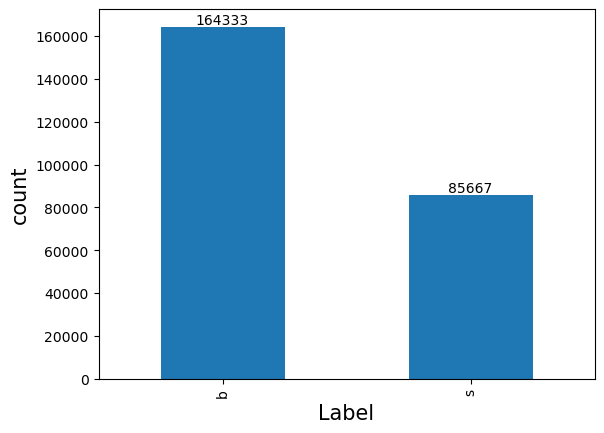

In [98]:
ax=df.Label.value_counts().plot(kind='bar')
for j in ax.containers:
    ax.bar_label(j)
    
plt.xlabel('Label',fontsize=15)
plt.ylabel('count',fontsize=15)


plt.show()

In [17]:
# Percentage of each labels in taget column:

np.round(df.Label.value_counts()*100/len(df),2)

b    65.73
s    34.27
Name: Label, dtype: float64

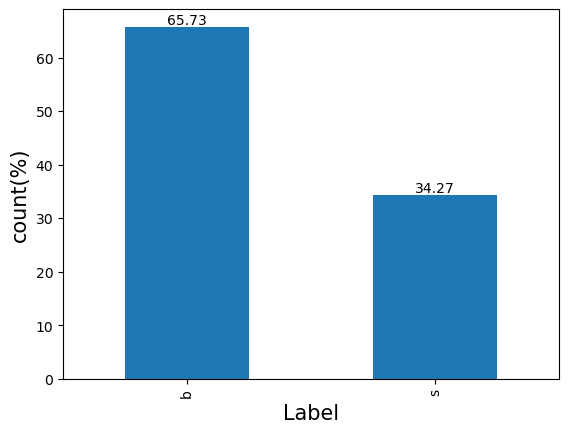

In [97]:
ax=(df.Label.value_counts(normalize=True)*100).plot(kind='bar')

for j in ax.containers:
    ax.bar_label(j,fmt='%.2f')
    
plt.xlabel('Label',fontsize=15)
plt.ylabel('count(%)',fontsize=15)
plt.show()

* Target is Imbalanced.

In [11]:
# Encoding the Target Column {'s':1,'b':0}

df.Label=df.Label.replace({'s':1,'b':0})

In [12]:
df.Label.value_counts()

0    164333
1     85667
Name: Label, dtype: int64

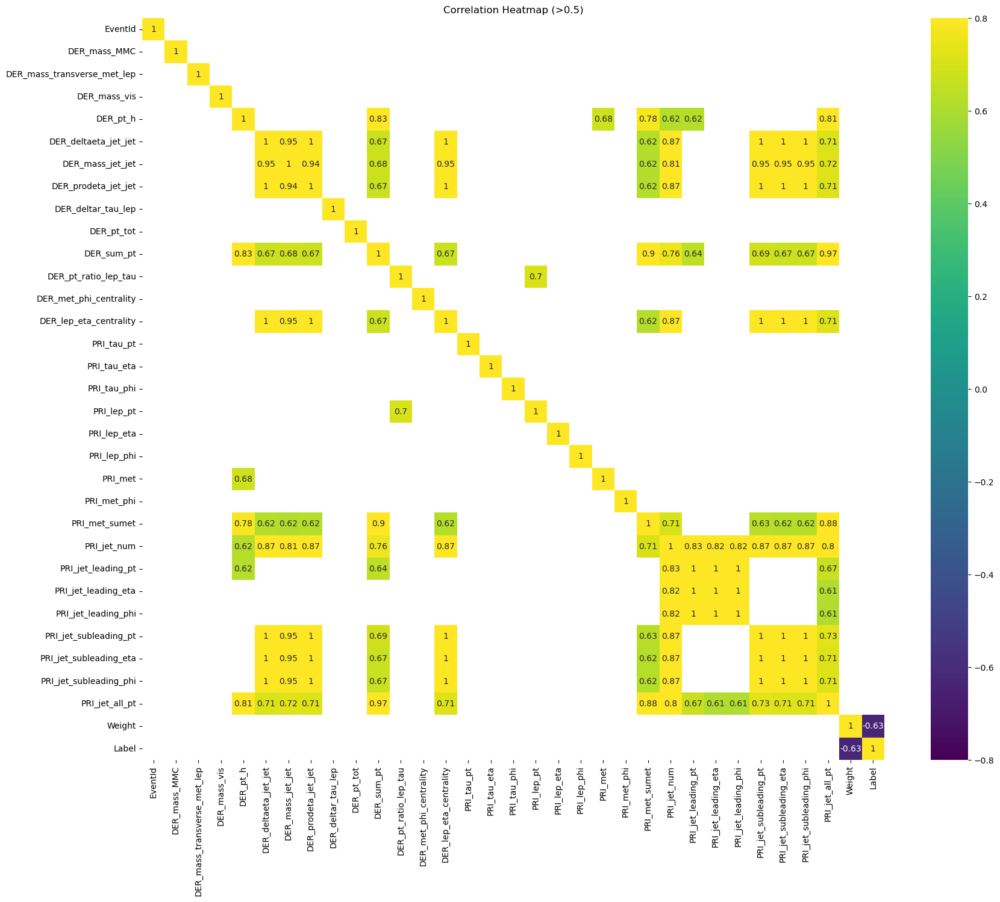

In [13]:
# Creating a mask for correlations greater than 0.6 or less than -0.6

corr_matrix = df.corr()

# Create a mask for correlations greater than 0.5 or less than -0.5
mask = (corr_matrix > 0.6) | (corr_matrix < -0.6)


plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix[mask], vmin=-0.8, vmax=0.8, square=True, annot=True, cmap='viridis')

plt.title("Correlation Heatmap (>0.5)")
plt.show()


* weight seems to have a strong correlation with Label.

## EDA and Preprocessing:

In [14]:
df.columns

Index(['EventId', 'DER_mass_MMC', 'DER_mass_transverse_met_lep',
       'DER_mass_vis', 'DER_pt_h', 'DER_deltaeta_jet_jet', 'DER_mass_jet_jet',
       'DER_prodeta_jet_jet', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality',
       'DER_lep_eta_centrality', 'PRI_tau_pt', 'PRI_tau_eta', 'PRI_tau_phi',
       'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt',
       'PRI_jet_leading_eta', 'PRI_jet_leading_phi', 'PRI_jet_subleading_pt',
       'PRI_jet_subleading_eta', 'PRI_jet_subleading_phi', 'PRI_jet_all_pt',
       'Weight', 'Label'],
      dtype='object')

### DER_mass_MMC:

In [15]:
df.DER_mass_MMC.value_counts()

-999.000     38114
 108.914        10
 96.819         10
 103.762        10
 108.957        10
 113.965        10
 130.799        10
 111.123        10
 132.292        10
 102.114        10
 121.261        10
 96.415         10
 125.466        10
 116.737         9
 113.746         9
 115.503         9
 105.847         9
 97.042          9
 115.520         9
 121.878         9
 87.233          9
 93.598          9
 98.677          9
 127.025         9
 106.626         9
 109.379         9
 105.811         9
 99.140          9
 86.995          9
 109.298         9
 91.748          9
 117.787         9
 119.890         9
 88.252          9
 91.022          9
 100.402         9
 119.010         9
 89.743          9
 137.313         9
 109.366         9
 133.075         9
 114.664         9
 116.049         9
 94.048          9
 104.996         9
 112.797         9
 100.663         9
 96.554          9
 93.146          9
 134.895         9
 111.354         9
 102.731         8
 94.549     

* we got an unexpecte value -999.000 which is present 38114 times in the data.
* According to the data description, DER_mass_MMC stands for Derived mass of the Missing Mass Calculator. Represents the
calculated mass of a system using the missing energy in the experiment.
* Mass of object cannot be in -ve.

In [16]:
# Extracting the columns which has -999.000:

abn=[]
for i in df.columns[1:32]:
    if -999.000 in df[i].values:
        abn.append(i)
        

In [17]:
abn

['DER_mass_MMC',
 'DER_deltaeta_jet_jet',
 'DER_mass_jet_jet',
 'DER_prodeta_jet_jet',
 'DER_lep_eta_centrality',
 'PRI_jet_leading_pt',
 'PRI_jet_leading_eta',
 'PRI_jet_leading_phi',
 'PRI_jet_subleading_pt',
 'PRI_jet_subleading_eta',
 'PRI_jet_subleading_phi']

In [18]:
# Calculating no of -999.000 and according to which the no of 1s and 0s:

for i in abn:
    print(i,':')
    print('\t')
    print('Value Count of -999.000 in',i,':',)
    print('-',df[df[i]==-999.000][i].value_counts().values[0])
    print('\t')
    print('Value Count(%) of -999.000 in',i,':')
    print('-',np.round(df[df[i]==-999.000][i].value_counts()*100/len(df),2).values[0],'%')
    print('\t')
    print('Value Count of Label(1 & 0) in data where',i,'is',-999.000,':')
    print(df[df[i]==-999.000]["Label"].value_counts())
    print('\t')
    print('Value Count(%) of Label(1 & 0) in data where',i,'is',-999.000,':')
    print(np.round(df[df[i]==-999.000]['Label'].value_counts()*100/len(df[df[i]==-999.000]),2),'%')
    print('\n')
    print('-----'*20)
    print('\n')

DER_mass_MMC :
	
Value Count of -999.000 in DER_mass_MMC :
- 38114
	
Value Count(%) of -999.000 in DER_mass_MMC :
- 15.25 %
	
Value Count of Label(1 & 0) in data where DER_mass_MMC is -999.0 :
0    35279
1     2835
Name: Label, dtype: int64
	
Value Count(%) of Label(1 & 0) in data where DER_mass_MMC is -999.0 :
0    92.56
1     7.44
Name: Label, dtype: float64 %


----------------------------------------------------------------------------------------------------


DER_deltaeta_jet_jet :
	
Value Count of -999.000 in DER_deltaeta_jet_jet :
- 177456
	
Value Count(%) of -999.000 in DER_deltaeta_jet_jet :
- 70.98 %
	
Value Count of Label(1 & 0) in data where DER_deltaeta_jet_jet is -999.0 :
0    124254
1     53202
Name: Label, dtype: int64
	
Value Count(%) of Label(1 & 0) in data where DER_deltaeta_jet_jet is -999.0 :
0    70.02
1    29.98
Name: Label, dtype: float64 %


----------------------------------------------------------------------------------------------------


DER_mass_jet_jet 

* ['DER_deltaeta_jet_jet','DER_mass_jet_jet','DER_prodeta_jet_jet','DER_lep_eta_centrality',
 'PRI_jet_subleading_pt','PRI_jet_subleading_eta','PRI_jet_subleading_phi']


* following columns have 70.98% -999.000 values in them. And majority are 0s in them. So we will drop these columns.

In [19]:
# Dropping the features which have 70.98% -999.000 in them:

df.drop(['DER_deltaeta_jet_jet','DER_mass_jet_jet','DER_prodeta_jet_jet','DER_lep_eta_centrality',
         'PRI_jet_subleading_pt','PRI_jet_subleading_eta','PRI_jet_subleading_phi'],axis=1,inplace=True)

In [20]:
# Extracting the features which have <50% -999 in them:

abn_less_50=[]

for i in abn:
    if i not in ['DER_deltaeta_jet_jet','DER_mass_jet_jet','DER_prodeta_jet_jet','DER_lep_eta_centrality',
 'PRI_jet_subleading_pt','PRI_jet_subleading_eta','PRI_jet_subleading_phi']:
        abn_less_50.append(i)
       

In [21]:
abn_less_50

['DER_mass_MMC',
 'PRI_jet_leading_pt',
 'PRI_jet_leading_eta',
 'PRI_jet_leading_phi']

In [22]:
# Calculating no of -999.000 and according to which the no of 1s and 0s:

for i in abn_less_50:
    print(i,':')
    print('\t')
    print('Value Count of -999.000 in',i,':',)
    print('-',df[df[i]==-999.000][i].value_counts().values[0])
    print('\t')
    print('Value Count(%) of -999.000 in',i,':')
    print('-',np.round(df[df[i]==-999.000][i].value_counts()*100/len(df),2).values[0],'%')
    print('\t')
    print('Value Count of Label(1 & 0) in data where',i,'is',-999.000,':')
    print(df[df[i]==-999.000]["Label"].value_counts())
    print('\t')
    print('Value Count(%) of Label(1 & 0) in data where',i,'is',-999.000,':')
    print(np.round(df[df[i]==-999.000]['Label'].value_counts()*100/len(df[df[i]==-999.000]),2),'%')
    print('\n')
    print('-----'*20)
    print('\n')

DER_mass_MMC :
	
Value Count of -999.000 in DER_mass_MMC :
- 38114
	
Value Count(%) of -999.000 in DER_mass_MMC :
- 15.25 %
	
Value Count of Label(1 & 0) in data where DER_mass_MMC is -999.0 :
0    35279
1     2835
Name: Label, dtype: int64
	
Value Count(%) of Label(1 & 0) in data where DER_mass_MMC is -999.0 :
0    92.56
1     7.44
Name: Label, dtype: float64 %


----------------------------------------------------------------------------------------------------


PRI_jet_leading_pt :
	
Value Count of -999.000 in PRI_jet_leading_pt :
- 99913
	
Value Count(%) of -999.000 in PRI_jet_leading_pt :
- 39.97 %
	
Value Count of Label(1 & 0) in data where PRI_jet_leading_pt is -999.0 :
0    74421
1    25492
Name: Label, dtype: int64
	
Value Count(%) of Label(1 & 0) in data where PRI_jet_leading_pt is -999.0 :
0    74.49
1    25.51
Name: Label, dtype: float64 %


----------------------------------------------------------------------------------------------------


PRI_jet_leading_eta :
	
Value 

<AxesSubplot:>

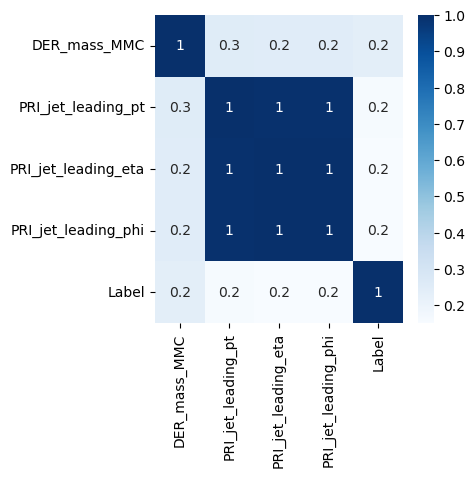

In [23]:
# Correlation of the features in abn_less_50 with Label:

plt.figure(figsize=(4,4))
sns.heatmap(df[abn_less_50+['Label']].corr(),annot=True,fmt='.1g',cmap='Blues')

* in the columns in abn_less_50 -999.000 are less than 40% and majority of the labels are 0s. So while training the prediction will be biased towards 0.
* So we will drop only the rows where -999.000 occurs in abn_less_50.

In [24]:
# Dropping the rows where -999.000 occurs:

for i in abn_less_50:
    df.drop(df[df[i]==-999.000].index,axis=0,inplace=True)

<AxesSubplot:>

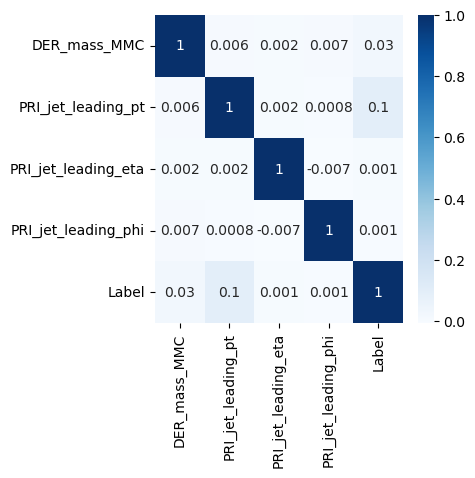

In [25]:
# New Correlation of the features in abn_less_50 with Label:

plt.figure(figsize=(4,4))
sns.heatmap(df[abn_less_50+['Label']].corr(),annot=True,fmt='.1g',cmap='Blues')

In [26]:
# New shape of data:

df.shape

(138096, 26)

In [27]:
# New Value Count of Label:

df.Label.value_counts()

0    79197
1    58899
Name: Label, dtype: int64

In [28]:
# New Value Count(%) of Label:

(np.round(df.Label.value_counts()*100/len(df),2))

0    57.35
1    42.65
Name: Label, dtype: float64

* Now the target seems to be balanced a bit.

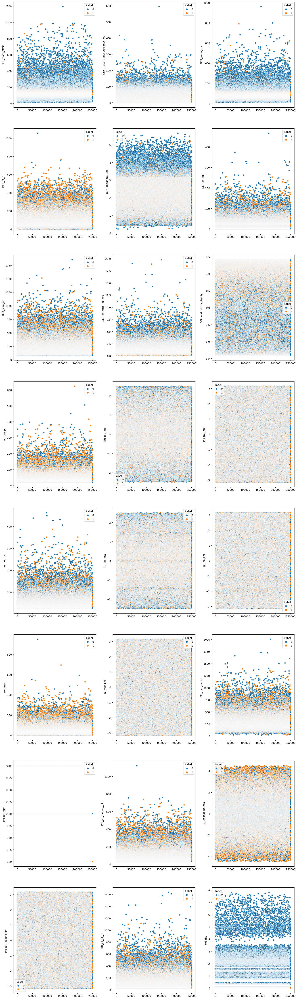

In [29]:
# Spread of Data:

plt.figure(figsize=(20,80),dpi=100)

pltno=1
for i in df.columns[1:len(df.columns)-1]:
    plt.subplot(9,3,pltno)
    sns.scatterplot(x=df[i].index,
                y=df[i],hue=df['Label'])
    pltno+=1
    
plt.show()

### PRI_jet_num:

In [30]:
# No of Counts of each value in PRI_jet_num:

for i in df.PRI_jet_num.value_counts().values:
    print(i)

69982
47427
20687


In [31]:
# Value Count of Label in each value in PRI_jet_num:

for i in df.PRI_jet_num.value_counts().index:
    print('PRI_jet_num:',i)
    print('\t')
    print(df[df['PRI_jet_num']==i]['Label'].value_counts())
    print('\n')

PRI_jet_num: 1
	
0    42977
1    27005
Name: Label, dtype: int64


PRI_jet_num: 2
	
1    25267
0    22160
Name: Label, dtype: int64


PRI_jet_num: 3
	
0    14060
1     6627
Name: Label, dtype: int64




### Weight:

In [32]:
df[df.Label==1]['Weight'].describe()

count    58899.000000
mean         0.005432
std          0.007079
min          0.001502
25%          0.001503
50%          0.001503
75%          0.002653
max          0.018636
Name: Weight, dtype: float64

In [33]:
df[df.Label==0]['Weight'].describe()

count    79197.000000
mean         1.396889
std          1.110105
min          0.064061
25%          0.309795
50%          1.454848
75%          2.083511
max          7.822543
Name: Weight, dtype: float64

In [34]:
df[df.Label==1]['Weight'].value_counts()

0.001503    35265
0.018636    13126
0.002653     5694
0.001502     4814
Name: Weight, dtype: int64

In [35]:
df[df.Label==0]['Weight'].value_counts()

1.681611    9844
0.744056    7018
1.454848    5651
0.073899    4644
0.071357    4490
0.309795    3725
0.307170    3176
0.064061    2936
1.373391    1497
0.083414    1381
0.358540    1212
0.300975     675
0.789461     490
0.428898     150
2.172305       2
2.211031       2
2.511884       2
2.551217       2
2.434939       2
1.946431       2
2.865537       2
2.399892       2
2.106114       2
2.110363       2
1.392126       2
2.020509       2
2.370648       2
2.238611       2
5.172815       2
2.257062       2
2.209036       2
1.302225       2
1.218339       2
2.942149       1
1.029446       1
2.575320       1
7.208774       1
2.509090       1
2.120124       1
2.298810       1
2.150570       1
1.876747       1
1.081343       1
0.912968       1
3.037533       1
0.950890       1
2.700876       1
2.411685       1
2.834183       1
1.847222       1
0.929264       1
2.056411       1
1.540971       1
2.608109       1
1.674340       1
2.610221       1
2.100499       1
1.090389       1
5.071391      

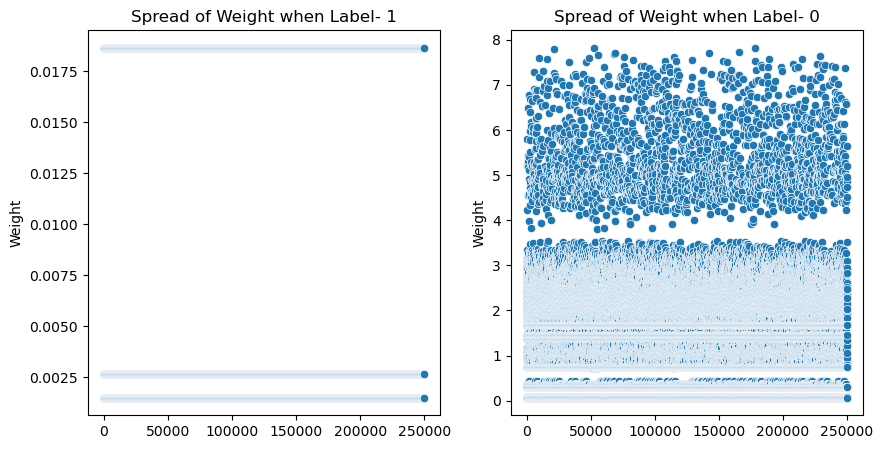

In [36]:
plt.figure(figsize=(10,5),dpi=100)

plt.subplot(1,2,1)
sns.scatterplot(x=df[df.Label==1]['Weight'].index,y=df[df.Label==1]['Weight'])
plt.title('Spread of Weight when Label- 1')

plt.subplot(1,2,2)
sns.scatterplot(x=df[df.Label==0]['Weight'].index,y=df[df.Label==0]['Weight'])
plt.title('Spread of Weight when Label- 0')


plt.show()

* For label is 0, the values of Weight does not exceed 1.

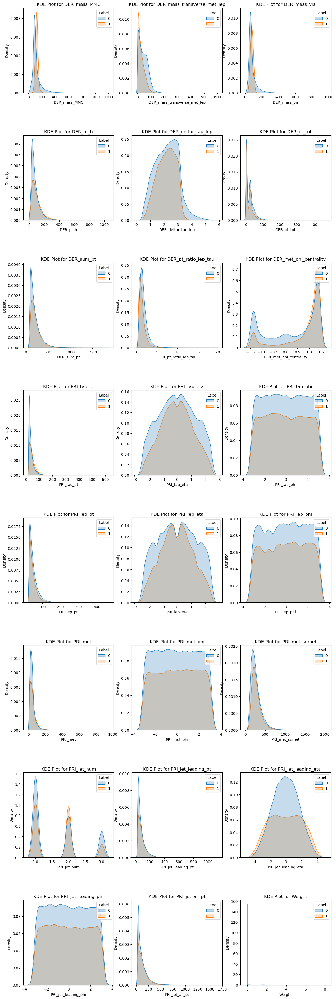

In [37]:
# KDE Plot Columns:

numerical_columns = df.columns[1:len(df.columns)-1]

# Calculate the number of rows needed
num_rows = (len(numerical_columns) + 2) // 3

# Set up subplots with 3 columns
fig, axes = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 6 * num_rows))
fig.subplots_adjust(hspace=0.5)

# Plot KDE for each numerical column
for i, column in enumerate(numerical_columns):
    row_idx, col_idx = divmod(i, 3)
    sns.kdeplot(data=df,hue='Label',x=column, ax=axes[row_idx, col_idx], fill=True)
    axes[row_idx, col_idx].set_title(f'KDE Plot for {column}')

# Remove empty subplots if the number of plots is not a multiple of 3
for i in range(len(numerical_columns), num_rows * 3):
    fig.delaxes(axes.flatten()[i])

plt.show()


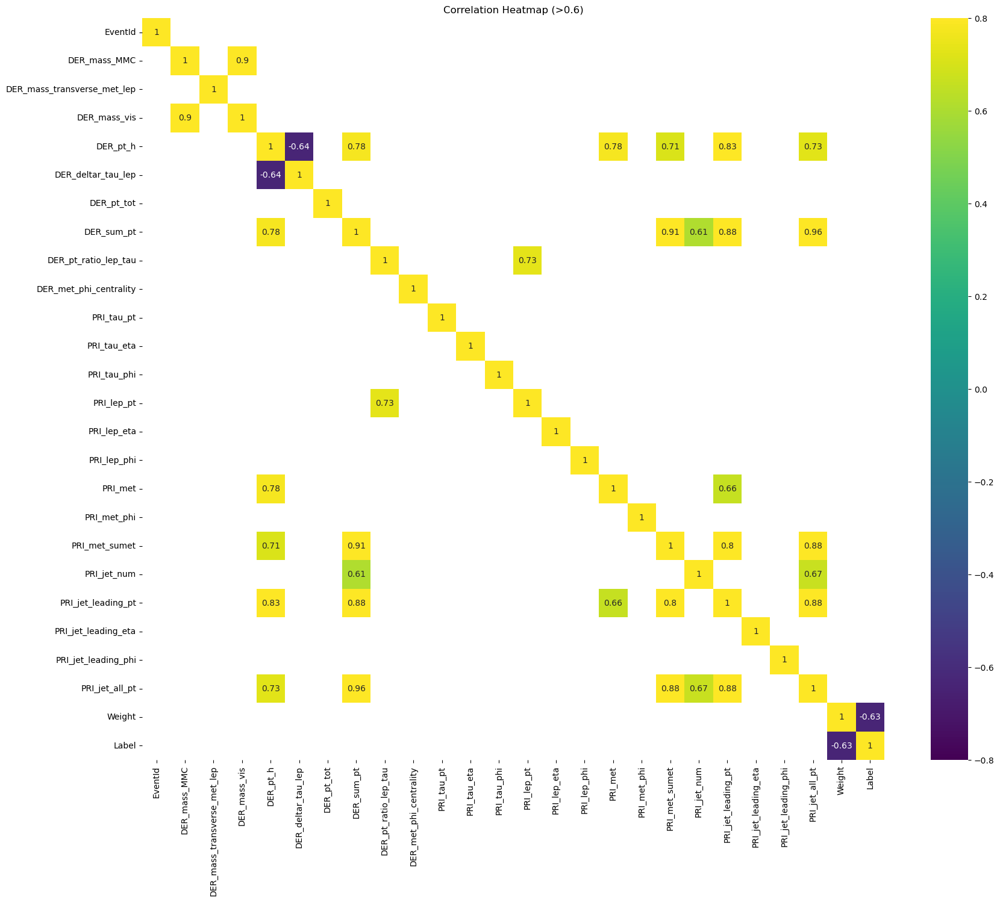

In [38]:
# Creating a mask for correlations greater than 0.6 or less than -0.6

corr_matrix = df.corr()

# Create a mask for correlations greater than 0.5 or less than -0.5
mask = (corr_matrix > 0.6) | (corr_matrix < -0.6)


plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix[mask], vmin=-0.8, vmax=0.8, square=True, annot=True, cmap='viridis')

plt.title("Correlation Heatmap (>0.6)")
plt.show()


## Modeling:

In [86]:
# Importing required packages:

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline,make_pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix,ConfusionMatrixDisplay, classification_report,accuracy_score
from sklearn.metrics import PrecisionRecallDisplay,precision_recall_curve,roc_auc_score,roc_curve

In [87]:
# Extraction of Features and Target from df:

X=df.drop(['EventId','Label'],axis=1)
y=df.Label

In [41]:
X.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_all_pt,Weight
0,138.470,51.655,97.827,27.980,3.064,41.928,197.760,1.582,1.396,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2,67.435,2.150,0.444,113.497,0.002653
1,160.937,68.768,103.235,48.146,3.473,2.078,125.157,0.879,1.414,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1,46.226,0.725,1.158,46.226,2.233584
5,89.744,13.550,59.149,116.344,1.362,61.619,278.876,0.588,0.479,53.651,0.371,1.329,31.565,-0.884,1.857,40.735,2.237,282.849,3,90.547,-2.412,-0.653,193.660,0.083414
6,148.754,28.862,107.782,106.130,2.941,2.545,305.967,3.371,1.393,28.850,1.113,2.409,97.240,0.675,-0.966,38.421,-1.443,294.074,2,123.010,0.864,1.450,179.877,0.002653
7,154.916,10.418,94.714,29.169,2.897,1.526,138.178,0.365,-1.305,78.800,0.654,1.547,28.740,0.506,-1.347,22.275,-1.761,187.299,1,30.638,-0.715,-1.724,30.638,0.018636


In [42]:
y.head()

0    1
1    0
5    0
6    1
7    1
Name: Label, dtype: int64

In [43]:
# train_test_split:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [44]:
# Feature Scaling:

scl=MinMaxScaler()

X_train_trans=pd.DataFrame(scl.fit_transform(X_train),columns=[i for i in X_train.columns])
X_test_trans=pd.DataFrame(scl.transform(X_test),columns=[i for i in X_test.columns])

In [45]:
# Assigning Labels:

Label=[1,0]

### Logistic Regression:

In [46]:
# Modeling with Logistic Regression:

log_reg=LogisticRegression()
log_reg.fit(X_train_trans,y_train)

# Prediction:

y_train_pred=log_reg.predict(X_train_trans)
y_test_pred=log_reg.predict(X_test_trans)


In [47]:
# accuracy_score(%):

print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
print('\t')
print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')

accuracy_score of Train:  93.86 %
	
accuracy_score of Test:  94.01 %


In [48]:
# Defining a function which will return a dataframe of confusion matrix:

def Confusion_Matrix(y_train,y_train_pred,Label):
    return pd.DataFrame(confusion_matrix(y_train,y_train_pred,labels=Label),
                        columns=['predicted_'+str(i) for i in Label],index=['Actual_'+str(i) for i in Label])

In [49]:
# Train Confusion_Matrix:

Confusion_Matrix(y_train,y_train_pred,Label)

,predicted_1,predicted_0
Actual_1,46554,560
Actual_0,6223,57139


In [50]:
# Test Confusion_Matrix:

Confusion_Matrix(y_test,y_test_pred,Label)

,predicted_1,predicted_0
Actual_1,11654,131
Actual_0,1524,14311


In [51]:
# Train Classification Report:

print(classification_report(y_train,y_train_pred,labels=Label))

              precision    recall  f1-score   support

           1       0.88      0.99      0.93     47114
           0       0.99      0.90      0.94     63362

    accuracy                           0.94    110476
   macro avg       0.94      0.94      0.94    110476
weighted avg       0.94      0.94      0.94    110476



In [52]:
# Test Classification Report:

print(classification_report(y_test,y_test_pred,labels=Label))

              precision    recall  f1-score   support

           1       0.88      0.99      0.93     11785
           0       0.99      0.90      0.95     15835

    accuracy                           0.94     27620
   macro avg       0.94      0.95      0.94     27620
weighted avg       0.95      0.94      0.94     27620



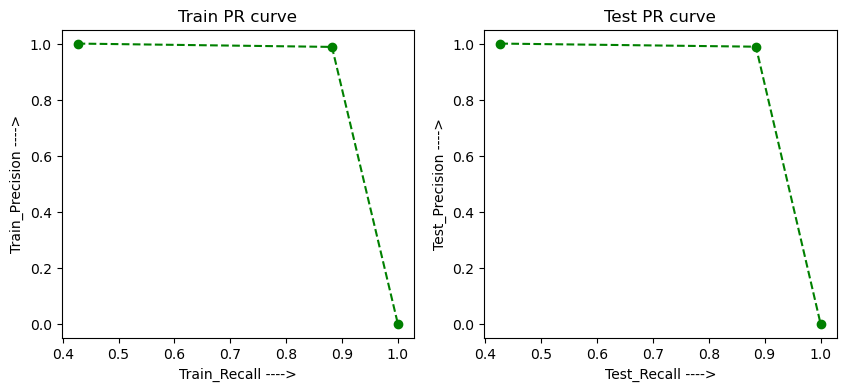

In [53]:
# Precision-Recall Curve of Train and Test:

plt.figure(figsize=(10,4),dpi=100)

train_precision, train_recall, train_thresholds = precision_recall_curve(y_train, y_train_pred)
test_precision, test_recall, test_thresholds = precision_recall_curve(y_test, y_test_pred)

plt.subplot(1,2,1)
plt.plot(train_precision,train_recall,color='green', marker='o', linestyle='dashed')
plt.ylabel("Train_Precision ---->")
plt.xlabel("Train_Recall ---->")
plt.title("Train PR curve")

plt.subplot(1,2,2)
plt.plot(test_precision,test_recall,color='green', marker='o', linestyle='dashed')
plt.ylabel("Test_Precision ---->")
plt.xlabel("Test_Recall ---->")
plt.title("Test PR curve")

plt.show()

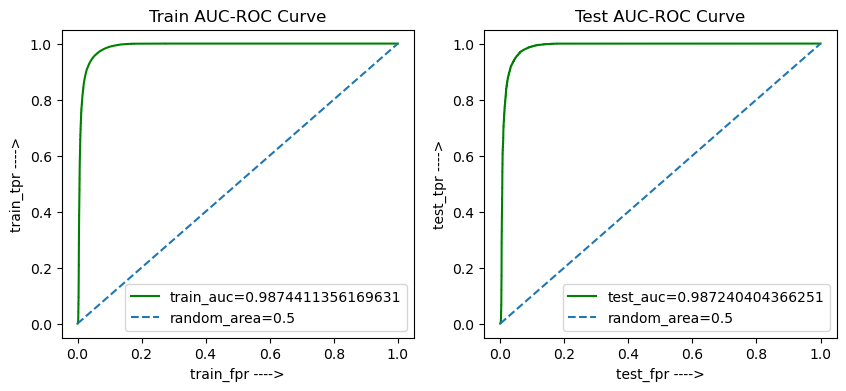

In [54]:
# AUC-ROC Curve of Train and Test:

plt.figure(figsize=(10,4),dpi=100)

train_fpr, train_tpr, train_thresholds= roc_curve(y_train,  log_reg.predict_proba(X_train_trans)[:,1])
test_fpr, test_tpr, test_thresholds= roc_curve(y_test,  log_reg.predict_proba(X_test_trans)[:,1])

train_auc = roc_auc_score(y_train, log_reg.predict_proba(X_train_trans)[:,1])
test_auc = roc_auc_score(y_test, log_reg.predict_proba(X_test_trans)[:,1])

plt.subplot(1,2,1)
plt.plot(train_fpr,train_tpr,label="train_auc="+str(train_auc),color='green')
plt.plot([0,1],[0,1],label='random_area='+str(0.5),linestyle='--')
plt.legend(loc=4)
plt.title("Train AUC-ROC Curve")
plt.xlabel("train_fpr ---->")
plt.ylabel("train_tpr ---->")

plt.subplot(1,2,2)
plt.plot(test_fpr,test_tpr,label="test_auc="+str(test_auc),color='green')
plt.plot([0,1],[0,1],label='random_area='+str(0.5),linestyle='--')
plt.legend(loc=4)
plt.title("Test AUC-ROC Curve")
plt.xlabel("test_fpr ---->")
plt.ylabel("test_tpr ---->")

plt.show()

In [55]:
# Optimal Threshold value for train and test:

train_optimal_idx = np.argmax(train_tpr - train_fpr)
test_optimal_idx = np.argmax(test_tpr - test_fpr)

train_optimal_threshold = train_thresholds[train_optimal_idx]
test_optimal_threshold = test_thresholds[test_optimal_idx]

print("train_optimal_threshold:",train_optimal_threshold)
print('\t')
print("test_optimal_threshold:",test_optimal_threshold)


train_optimal_threshold: 0.6164139105396046
	
test_optimal_threshold: 0.6083339161459526


### Decision Tree:

In [58]:
# Modeling with Decision Tree:

dt=DecisionTreeClassifier()
dt.fit(X_train_trans,y_train)

# Prediction:

y_train_pred=dt.predict(X_train_trans)
y_test_pred=dt.predict(X_test_trans)


In [59]:
# accuracy_score(%):

print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
print('\t')
print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')

accuracy_score of Train:  100.0 %
	
accuracy_score of Test:  100.0 %


In [60]:
# Train Confusion_Matrix:

Confusion_Matrix(y_train,y_train_pred,Label)

,predicted_1,predicted_0
Actual_1,47114,0
Actual_0,0,63362


In [61]:
# Test Confusion_Matrix:

Confusion_Matrix(y_test,y_test_pred,Label)

,predicted_1,predicted_0
Actual_1,11785,0
Actual_0,0,15835


In [62]:
# Train Classification Report:

print(classification_report(y_train,y_train_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476



In [63]:
# Test Classification Report:

print(classification_report(y_test,y_test_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00      1.00      1.00     27620
weighted avg       1.00      1.00      1.00     27620



### Random Forest:

In [65]:
# Modeling with Random Forest:

rf=RandomForestClassifier()
rf.fit(X_train_trans,y_train)

# Prediction:

y_train_pred=rf.predict(X_train_trans)
y_test_pred=rf.predict(X_test_trans)


In [66]:
# accuracy_score(%):

print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
print('\t')
print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')

accuracy_score of Train:  100.0 %
	
accuracy_score of Test:  100.0 %


In [67]:
# Train Confusion_Matrix:

Confusion_Matrix(y_train,y_train_pred,Label)

,predicted_1,predicted_0
Actual_1,47114,0
Actual_0,0,63362


In [68]:
# Test Confusion_Matrix:

Confusion_Matrix(y_test,y_test_pred,Label)

,predicted_1,predicted_0
Actual_1,11785,0
Actual_0,0,15835


In [69]:
# Train Classification Report:

print(classification_report(y_train,y_train_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476



In [70]:
# Test Classification Report:

print(classification_report(y_test,y_test_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00      1.00      1.00     27620
weighted avg       1.00      1.00      1.00     27620



### SVC:

In [73]:
# Modeling with SVC:

svc=SVC()
svc.fit(X_train_trans,y_train)

# Prediction:

y_train_pred=svc.predict(X_train_trans)
y_test_pred=svc.predict(X_test_trans)


In [74]:
# accuracy_score(%):

print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
print('\t')
print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')

accuracy_score of Train:  94.89 %
	
accuracy_score of Test:  94.84 %


In [75]:
# Train Confusion_Matrix:

Confusion_Matrix(y_train,y_train_pred,Label)

,predicted_1,predicted_0
Actual_1,46702,412
Actual_0,5228,58134


In [76]:
# Test Confusion_Matrix:

Confusion_Matrix(y_test,y_test_pred,Label)

,predicted_1,predicted_0
Actual_1,11661,124
Actual_0,1302,14533


In [77]:
# Train Classification Report:

print(classification_report(y_train,y_train_pred,labels=Label))

              precision    recall  f1-score   support

           1       0.90      0.99      0.94     47114
           0       0.99      0.92      0.95     63362

    accuracy                           0.95    110476
   macro avg       0.95      0.95      0.95    110476
weighted avg       0.95      0.95      0.95    110476



In [78]:
# Test Classification Report:

print(classification_report(y_test,y_test_pred,labels=Label))

              precision    recall  f1-score   support

           1       0.90      0.99      0.94     11785
           0       0.99      0.92      0.95     15835

    accuracy                           0.95     27620
   macro avg       0.95      0.95      0.95     27620
weighted avg       0.95      0.95      0.95     27620



### AdaBoost:

In [80]:
# Modeling with Ada Boost:

adb=AdaBoostClassifier()
adb.fit(X_train_trans,y_train)

# Prediction:

y_train_pred=adb.predict(X_train_trans)
y_test_pred=adb.predict(X_test_trans)


In [81]:
# accuracy_score(%):

print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
print('\t')
print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')

accuracy_score of Train:  100.0 %
	
accuracy_score of Test:  100.0 %


In [82]:
# Train Confusion_Matrix:

Confusion_Matrix(y_train,y_train_pred,Label)

,predicted_1,predicted_0
Actual_1,47114,0
Actual_0,0,63362


In [83]:
# Test Confusion_Matrix:

Confusion_Matrix(y_test,y_test_pred,Label)

,predicted_1,predicted_0
Actual_1,11785,0
Actual_0,0,15835


In [84]:
# Train Classification Report:

print(classification_report(y_train,y_train_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476



In [85]:
# Test Classification Report:

print(classification_report(y_test,y_test_pred,labels=Label))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00      1.00      1.00     27620
weighted avg       1.00      1.00      1.00     27620



In [ ]:
# prediction with AdaBoost using the features where varience of feature is >0:

Prediction(X_train_trans[[i for i in X_train_trans.columns if X_train_trans[i].var()>0]],
           X_test_trans[[i for i in X_test_trans.columns if X_test_trans[i].var()>0]],
           y_train,y_test,AdaBoostClassifier(),Label)

### Gradient Boosting:

In [89]:
# Creating a function definition for prediction:

def Prediction(X_train_trans,X_test_trans,y_train,y_test,model,Label):
    
    print(f'{model} : ')
    print('\t')
    
    # fitting:
    model.fit(X_train_trans,y_train)
    
    # prediction:
    y_train_pred=model.predict(X_train_trans)
    y_test_pred=model.predict(X_test_trans)
    
    # accuracy_score(%):
    print('Accuracy_Score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
    print('Accuracy_Score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')
    print('\t')
    # Defining a function which will return a dataframe of confusion matrix:
    def Confusion_Matrix(y_train,y_train_pred,Label):
        return pd.DataFrame(confusion_matrix(y_train,y_train_pred,labels=Label),
                            columns=['predicted_'+str(i) for i in Label],index=['Actual_'+str(i) for i in Label])
    
    print('Train Confusion_Matrix:')
    print('\t')
    # Train Confusion_Matrix:
    print(Confusion_Matrix(y_train,y_train_pred,Label))
    print('\t')
    print('Test Confusion_Matrix:')
    print('\t')
    # Test Confusion_Matrix:
    print(Confusion_Matrix(y_test,y_test_pred,Label))
    print('\t')
    
    print('Train Classification Report:')
    print('\t')
    # Train Classification Report:
    print(classification_report(y_train,y_train_pred,labels=Label))
    print('\t')
    print('Test Classification Report:')
    print('\t')
    # Test Classification Report:
    print(classification_report(y_test,y_test_pred,labels=Label))
    

In [90]:
# prediction with Gradient Boosting:

Prediction(X_train_trans,
           X_test_trans,
           y_train,y_test,GradientBoostingClassifier(),Label)

GradientBoostingClassifier() : 
	
Accuracy_Score of Train:  100.0 %
Accuracy_Score of Test:  100.0 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11785            0
Actual_0            0        15835
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00 

#### Conclusion:
* Tree Based models are giving 100% accuracy_score.
* Between LogisticRegression and SVC, misclassification rate of LogisticRegression is higher than SVC.

## Feature Selection and Feature Extraction:

In [93]:
# looking for duplicate rows in df:

df.duplicated().sum()

0

In [99]:
# Defining a function to fetch duplicate features:

def get_duplicate_columns(df):
    
    duplicate_columns = {}
    seen_columns = {}

    for column in df.columns:
        current_column = df[column]

        # Convert column data to bytes
        try:
            current_column_hash = current_column.values.tobytes()
        except AttributeError:
            current_column_hash = current_column.to_string().encode()

        if current_column_hash in seen_columns:
            if seen_columns[current_column_hash] in duplicate_columns:
                duplicate_columns[seen_columns[current_column_hash]].append(column)
            else:
                duplicate_columns[seen_columns[current_column_hash]] = [column]
        else:
            seen_columns[current_column_hash] = column

    return duplicate_columns

In [100]:
df_duplicate_feature=get_duplicate_columns(df)

In [101]:
df_duplicate_feature

{}

* No Duplicate rows or features present in data.

### Varience Threshold:

In [102]:
# Calculating the features whoose varience is >0.05

from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold(threshold=0.05)

In [105]:
# fitting

sel.fit(X_train_trans)

VarianceThreshold(threshold=0.05)

In [106]:
sum(sel.get_support())

8

* 8 features are above varience threshold.

In [111]:
# Fetching the features which are above varience threshold:

high_var_cols=X_train_trans.columns[sel.get_support()]

In [114]:
# prediction with LogisticRegression with high_var_cols:

Prediction(X_train_trans[high_var_cols],
           X_test_trans[high_var_cols],
           y_train,y_test,LogisticRegression(),Label)

LogisticRegression() : 
	
Accuracy_Score of Train:  60.4 %
Accuracy_Score of Test:  60.08 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        25083        22031
Actual_0        21721        41641
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1         6262         5523
Actual_0         5503        10332
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       0.54      0.53      0.53     47114
           0       0.65      0.66      0.66     63362

    accuracy                           0.60    110476
   macro avg       0.59      0.59      0.59    110476
weighted avg       0.60      0.60      0.60    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.53      0.53      0.53     11785
           0       0.65      0.65      0.65     15835

    accuracy                           0.60     27620
   macro avg       0.59      0.59

In [115]:
# prediction with LogisticRegression with high_var_cols:

Prediction(X_train_trans[high_var_cols],
           X_test_trans[high_var_cols],
           y_train,y_test,DecisionTreeClassifier(),Label)

DecisionTreeClassifier() : 
	
Accuracy_Score of Train:  100.0 %
Accuracy_Score of Test:  57.98 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1         6060         5725
Actual_0         5882         9953
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.51      0.51      0.51     11785
           0       0.63      0.63      0.63     15835

    accuracy                           0.58     27620
   macro avg       0.57     

* Accuracy Reduced.

### Correlation based features:

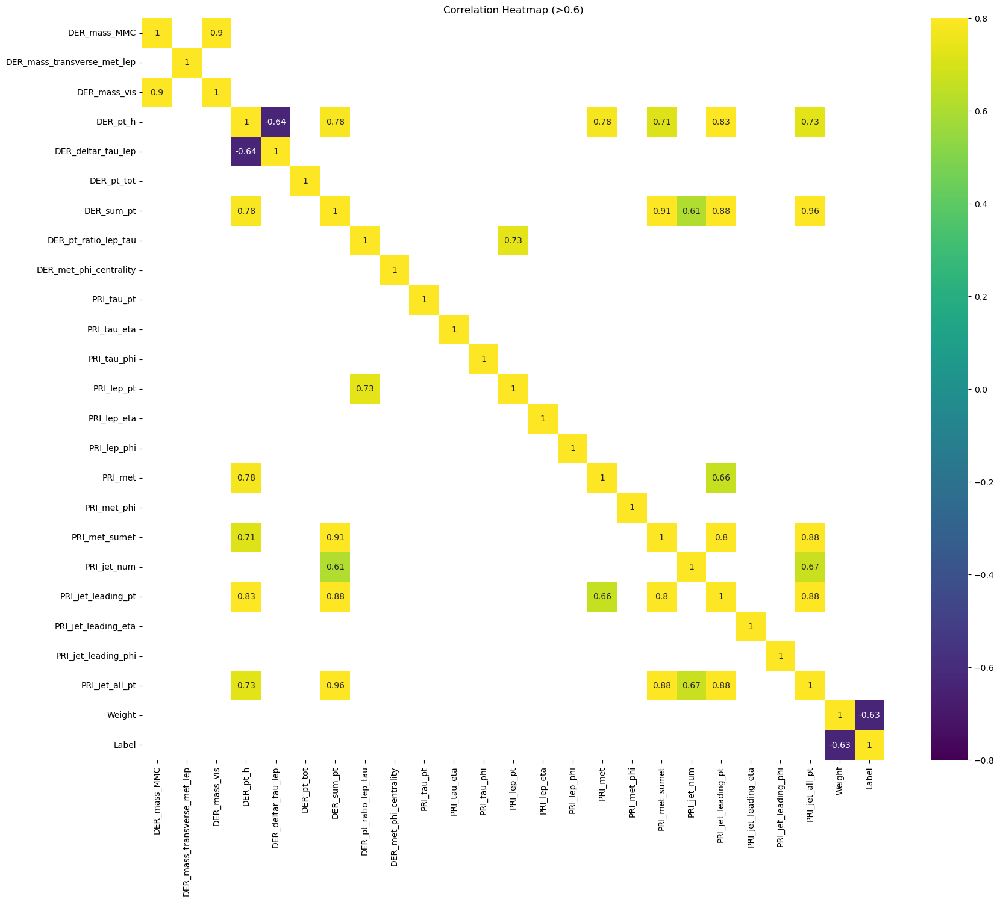

In [186]:
# Correlation for X_train:

# Creating a mask for correlations greater than 0.6 or less than -0.6

X_train['Label']=y_train

corr_matrix = X_train.corr()

# Create a mask for correlations greater than 0.5 or less than -0.5
mask = (corr_matrix > 0.6) | (corr_matrix < -0.6)


plt.figure(figsize=(20, 16))
sns.heatmap(corr_matrix[mask], vmin=-0.8, vmax=0.8, square=True, annot=True, cmap='viridis')

plt.title("Correlation Heatmap (>0.6)")
plt.show()


In [197]:
corr_matrix

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_all_pt,Weight,Label
DER_mass_MMC,1.000000,0.224143,0.904742,0.025060,0.539195,0.021218,0.111883,0.064033,0.004132,0.222538,-0.001752,-0.005939,0.286749,0.003306,-0.003874,0.096076,0.001580,0.082910,0.006627,0.008531,0.003067,0.008884,0.005562,0.116343,0.024170
DER_mass_transverse_met_lep,0.224143,1.000000,0.272386,-0.190393,0.161572,0.042183,-0.061491,0.285251,-0.356443,-0.087464,0.002222,0.003024,0.289803,0.007399,0.000765,-0.032956,-0.013751,-0.064655,-0.063258,-0.152937,0.000225,0.005262,-0.123986,0.359914,-0.267657
DER_mass_vis,0.904742,0.272386,1.000000,-0.097389,0.557728,-0.007205,0.062681,0.136653,-0.163096,0.227035,-0.003988,-0.003682,0.382582,0.005437,-0.004037,-0.147396,-0.000755,0.027414,-0.041295,-0.085902,0.004008,0.006210,-0.078649,0.203885,-0.034994
DER_pt_h,0.025060,-0.190393,-0.097389,1.000000,-0.636255,0.199935,0.781693,0.089678,0.354479,0.447411,-0.005876,0.005688,0.387586,-0.007981,-0.005142,0.776362,0.006215,0.712580,0.341253,0.831617,0.003082,0.001539,0.726869,-0.270367,0.156847
DER_deltar_tau_lep,0.539195,0.161572,0.557728,-0.636255,1.000000,-0.132263,-0.473447,0.071256,-0.185515,-0.283497,0.001280,-0.011166,-0.113061,0.007818,-0.000094,-0.389379,0.000338,-0.445294,-0.246512,-0.522540,0.001193,0.006837,-0.467504,0.231632,-0.022216
DER_pt_tot,0.021218,0.042183,-0.007205,0.199935,-0.132263,1.000000,0.397861,0.038214,-0.002720,0.077797,0.001653,0.001386,0.096374,-0.000692,-0.006341,0.192434,-0.001170,0.469305,0.435525,0.216821,-0.004195,0.004546,0.433595,-0.138985,-0.083010
DER_sum_pt,0.111883,-0.061491,0.062681,0.781693,-0.473447,0.397861,1.000000,0.114528,0.185990,0.486723,-0.004511,0.003192,0.458009,-0.005796,-0.005773,0.545767,0.003629,0.905189,0.610538,0.880817,0.000976,0.003713,0.961256,-0.280675,0.074448
DER_pt_ratio_lep_tau,0.064033,0.285251,0.136653,0.089678,0.071256,0.038214,0.114528,1.000000,-0.090506,-0.474578,0.001800,0.002720,0.733093,0.004314,-0.001383,0.003477,0.000609,0.050005,0.039902,0.077786,0.002287,0.000291,0.075443,0.231567,-0.164777
DER_met_phi_centrality,0.004132,-0.356443,-0.163096,0.354479,-0.185515,-0.002720,0.185990,-0.090506,1.000000,0.068225,0.000269,-0.006798,-0.049103,-0.006700,-0.003212,0.232389,0.006966,0.166511,0.118755,0.256968,0.006016,0.000256,0.218113,-0.319498,0.237901
PRI_tau_pt,0.222538,-0.087464,0.227035,0.447411,-0.283497,0.077797,0.486723,-0.474578,0.068225,1.000000,-0.005654,0.000455,0.039215,-0.005159,-0.000179,0.170940,-0.000038,0.455355,0.132246,0.377390,0.000777,0.003624,0.318517,-0.230910,0.181206


In [213]:
# Get the column names of the DataFrame
columns = corr_matrix.columns

# Create an empty list to keep track of columns to drop
columns_to_drop = []

# Loop over the columns
for i in range(len(columns)-1):
    for j in range(i + 1, len(columns)-1):

        if corr_matrix.loc[columns[i], columns[j]] > 0.6 or corr_matrix.loc[columns[i], columns[j]]< -0.6:
            columns_to_drop.append(columns[i])
            columns_to_drop.append(columns[j])
            if abs(corr_matrix.loc[columns[i], columns[-1]]) > abs(corr_matrix.loc[columns[j], columns[-1]]):
                columns_to_drop.remove(columns[j])
            else:
                columns_to_drop.remove(columns[i])



columns_to_drop=set(columns_to_drop)  
columns_to_drop=list(columns_to_drop)
print(len(columns_to_drop))

7


In [214]:
columns_to_drop

['DER_pt_h',
 'PRI_jet_all_pt',
 'DER_mass_vis',
 'PRI_jet_leading_pt',
 'DER_sum_pt',
 'DER_pt_ratio_lep_tau',
 'PRI_met']

In [209]:
X_train.drop(['Label'],axis=1,inplace=True)

In [218]:
# Logistic Regression:

Prediction(X_train_trans.drop(columns_to_drop,axis=1),
           X_test_trans.drop(columns_to_drop,axis=1),
           y_train,y_test,LogisticRegression(),Label)

LogisticRegression() : 
	
Accuracy_Score of Train:  93.33 %
Accuracy_Score of Test:  93.73 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        46582          532
Actual_0         6840        56522
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11666          119
Actual_0         1612        14223
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       0.87      0.99      0.93     47114
           0       0.99      0.89      0.94     63362

    accuracy                           0.93    110476
   macro avg       0.93      0.94      0.93    110476
weighted avg       0.94      0.93      0.93    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.88      0.99      0.93     11785
           0       0.99      0.90      0.94     15835

    accuracy                           0.94     27620
   macro avg       0.94      0.9

In [219]:
# SVC:

Prediction(X_train_trans.drop(columns_to_drop,axis=1),
           X_test_trans.drop(columns_to_drop,axis=1),
           y_train,y_test,SVC(),Label)

SVC() : 
	
Accuracy_Score of Train:  94.41 %
Accuracy_Score of Test:  94.5 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        46765          349
Actual_0         5827        57535
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11676          109
Actual_0         1409        14426
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       0.89      0.99      0.94     47114
           0       0.99      0.91      0.95     63362

    accuracy                           0.94    110476
   macro avg       0.94      0.95      0.94    110476
weighted avg       0.95      0.94      0.94    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.89      0.99      0.94     11785
           0       0.99      0.91      0.95     15835

    accuracy                           0.95     27620
   macro avg       0.94      0.95      0.94     

### Anova:

In [152]:
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import SelectKBest


sel = SelectKBest(f_classif, k=20).fit(X_train, y_train)

# display selected feature names
X_train.columns[sel.get_support()]

Index(['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_mass_vis',
       'DER_pt_h', 'DER_deltar_tau_lep', 'DER_pt_tot', 'DER_sum_pt',
       'DER_pt_ratio_lep_tau', 'DER_met_phi_centrality', 'PRI_tau_pt',
       'PRI_tau_phi', 'PRI_lep_pt', 'PRI_lep_eta', 'PRI_met', 'PRI_met_phi',
       'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_pt', 'PRI_jet_all_pt',
       'Weight'],
      dtype='object')

In [156]:
c=20

for i in range(3):
    sel = SelectKBest(f_classif, k=c).fit(X_train, y_train)
    columns=X_train.columns[sel.get_support()]
    
    Prediction(X_train_trans[columns],X_test_trans[columns],y_train,y_test,LogisticRegression(),Label)
    c=c-5
    print('-----'*20)
    

LogisticRegression() : 
	
Accuracy_Score of Train:  93.86 %
Accuracy_Score of Test:  94.02 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        46554          560
Actual_0         6224        57138
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11655          130
Actual_0         1522        14313
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       0.88      0.99      0.93     47114
           0       0.99      0.90      0.94     63362

    accuracy                           0.94    110476
   macro avg       0.94      0.94      0.94    110476
weighted avg       0.94      0.94      0.94    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.88      0.99      0.93     11785
           0       0.99      0.90      0.95     15835

    accuracy                           0.94     27620
   macro avg       0.94      0.9

In [158]:
c=20

for i in range(4):
    sel = SelectKBest(f_classif, k=c).fit(X_train, y_train)
    columns=X_train.columns[sel.get_support()]
    
    Prediction(X_train_trans[columns],X_test_trans[columns],y_train,y_test,DecisionTreeClassifier(),Label)
    c=c-5
    print('-----'*20)
    

DecisionTreeClassifier() : 
	
Accuracy_Score of Train:  100.0 %
Accuracy_Score of Test:  100.0 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11785            0
Actual_0            0        15835
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00     

In [159]:
sel = SelectKBest(f_classif, k=5).fit(X_train, y_train)
X_train.columns[sel.get_support()]

Index(['DER_mass_transverse_met_lep', 'DER_pt_ratio_lep_tau',
       'DER_met_phi_centrality', 'PRI_tau_pt', 'Weight'],
      dtype='object')

<AxesSubplot:ylabel='Weight'>

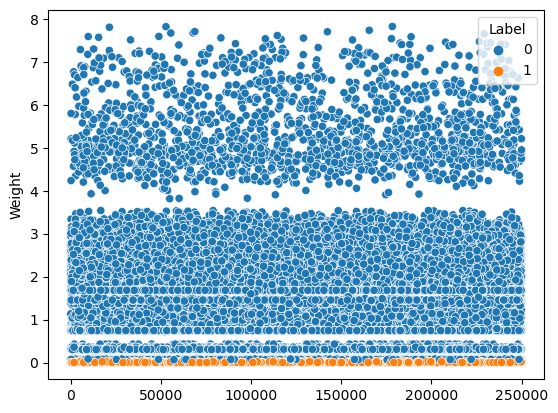

In [160]:
sns.scatterplot(x=X_train.Weight.index,y=X_train.Weight,hue=y_train)

In [162]:
c=20

for i in range(4):
    sel = SelectKBest(f_classif, k=c).fit(X_train, y_train)
    columns=X_train.columns[sel.get_support()]
    
    Prediction(X_train_trans[columns[0:len(columns)-1]],X_test_trans[columns[0:len(columns)-1]],y_train,y_test,LogisticRegression(),Label)
    c=c-5
    print('-----'*20)
    

LogisticRegression() : 
	
Accuracy_Score of Train:  68.09 %
Accuracy_Score of Test:  68.46 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        27692        19422
Actual_0        15829        47533
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1         6936         4849
Actual_0         3863        11972
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       0.64      0.59      0.61     47114
           0       0.71      0.75      0.73     63362

    accuracy                           0.68    110476
   macro avg       0.67      0.67      0.67    110476
weighted avg       0.68      0.68      0.68    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       0.64      0.59      0.61     11785
           0       0.71      0.76      0.73     15835

    accuracy                           0.68     27620
   macro avg       0.68      0.6

In [173]:
# Statistical Summary of Weight where Label is 1:

X_train.Weight[y_train[y_train==1].index].describe()

count    47114.000000
mean         0.005408
std          0.007063
min          0.001502
25%          0.001503
50%          0.001503
75%          0.002653
max          0.018636
Name: Weight, dtype: float64

In [174]:
# Varience of Weight where Label is 1:

X_train.Weight[y_train[y_train==1].index].var()

4.987992011095476e-05

In [6]:
np.round(4.987992011095476e-05,6)

5e-05

* Those Values of Weight where Label is 1 have a linear spread towards x axis.
* Weight is highly correlated with target.

In [175]:
len(X_train.columns)

24

In [183]:
# LogisticRegression:

for i in range(23,4,-1):
    sel = SelectKBest(f_classif, k=i).fit(X_train.drop(['Weight'],axis=1), y_train)
    columns=X_train.drop(['Weight'],axis=1).columns[sel.get_support()]
    
    log_reg=LogisticRegression().fit(X_train_trans[columns],y_train)
    y_train_pred=log_reg.predict(X_train_trans[columns])
    y_test_pred=log_reg.predict(X_test_trans[columns])
    
    print('K: ',i)
    # accuracy_score(%):
    print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
   
    print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')
    print('\n')
    # Train Confusion_Matrix:

    print(Confusion_Matrix(y_train,y_train_pred,Label))
    print('\t')
    
    # Test Confusion_Matrix:

    print(Confusion_Matrix(y_test,y_test_pred,Label))
    print('------'*20)
    

    

K:  23
accuracy_score of Train:  68.11 %
accuracy_score of Test:  68.39 %


          predicted_1  predicted_0
Actual_1        27640        19474
Actual_0        15760        47602
	
          predicted_1  predicted_0
Actual_1         6919         4866
Actual_0         3864        11971
------------------------------------------------------------------------------------------------------------------------
K:  22
accuracy_score of Train:  68.07 %
accuracy_score of Test:  68.37 %


          predicted_1  predicted_0
Actual_1        27698        19416
Actual_0        15854        47508
	
          predicted_1  predicted_0
Actual_1         6934         4851
Actual_0         3884        11951
------------------------------------------------------------------------------------------------------------------------
K:  21
accuracy_score of Train:  68.12 %
accuracy_score of Test:  68.49 %


          predicted_1  predicted_0
Actual_1        27713        19401
Actual_0        15824        47538
	

In [185]:
# Decision Tree:

for i in range(23,4,-1):
    sel = SelectKBest(f_classif, k=i).fit(X_train.drop(['Weight'],axis=1), y_train)
    columns=X_train.drop(['Weight'],axis=1).columns[sel.get_support()]
    
    dt=DecisionTreeClassifier().fit(X_train_trans[columns],y_train)
    y_train_pred=dt.predict(X_train_trans[columns])
    y_test_pred=dt.predict(X_test_trans[columns])
    
    print('K: ',i)
    # accuracy_score(%):
    print('accuracy_score of Train: ',np.round(accuracy_score(y_train,y_train_pred)*100,2),'%')
   
    print('accuracy_score of Test: ',np.round(accuracy_score(y_test,y_test_pred)*100,2),'%')
    print('\n')
    # Train Confusion_Matrix:

    print(Confusion_Matrix(y_train,y_train_pred,Label))
    print('\t')
    
    # Test Confusion_Matrix:

    print(Confusion_Matrix(y_test,y_test_pred,Label))
    print('------'*20)
    

    

K:  23
accuracy_score of Train:  100.0 %
accuracy_score of Test:  73.77 %


          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
          predicted_1  predicted_0
Actual_1         8201         3584
Actual_0         3662        12173
------------------------------------------------------------------------------------------------------------------------
K:  22
accuracy_score of Train:  100.0 %
accuracy_score of Test:  73.33 %


          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
          predicted_1  predicted_0
Actual_1         8119         3666
Actual_0         3701        12134
------------------------------------------------------------------------------------------------------------------------
K:  21
accuracy_score of Train:  100.0 %
accuracy_score of Test:  73.14 %


          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	

In [223]:
X_train_trans.head()

,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_all_pt,Weight
0,0.027734,0.076305,0.026452,0.089704,0.075861,0.004696,0.066349,0.088431,0.534653,0.026568,0.549349,0.629317,0.079905,0.623723,0.548146,0.017943,0.797422,0.184750,0.0,0.057173,0.510113,0.105205,0.038886,2.737629e-01
1,0.108903,0.062258,0.103266,0.031494,0.446143,0.006658,0.012021,0.059445,0.013791,0.014322,0.977578,0.794525,0.017884,0.542777,0.552602,0.011315,0.137810,0.072143,0.0,0.005575,0.677595,0.158364,0.003792,2.148192e-01
2,0.115963,0.112378,0.121442,0.145861,0.312281,0.094533,0.215103,0.342860,0.025460,0.007993,0.681281,0.557536,0.324805,0.745342,0.256724,0.011839,0.975652,0.185112,1.0,0.085778,0.463214,0.758714,0.130986,1.067633e-07
3,0.065132,0.102238,0.062929,0.023904,0.350764,0.070847,0.017006,0.100259,0.170792,0.005129,0.807808,0.256088,0.047601,0.873572,0.590960,0.020854,0.099777,0.064187,0.0,0.005605,0.149700,0.766831,0.003812,6.156972e-01
4,0.299277,0.055993,0.262204,0.087269,0.430307,0.006986,0.209332,0.034164,0.985856,0.223908,0.396997,0.112208,0.166005,0.449008,0.706987,0.034078,0.802992,0.231628,0.5,0.104533,0.606024,0.433233,0.101596,3.908273e-02


In [228]:
# Taking Weight only:

Prediction(X_train_trans['Weight'].array.reshape(-1, 1),X_test_trans['Weight'].array.reshape(-1, 1),
          y_train,y_test,DecisionTreeClassifier(),Label)

DecisionTreeClassifier() : 
	
Accuracy_Score of Train:  100.0 %
Accuracy_Score of Test:  100.0 %
	
Train Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        47114            0
Actual_0            0        63362
	
Test Confusion_Matrix:
	
          predicted_1  predicted_0
Actual_1        11785            0
Actual_0            0        15835
	
Train Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     47114
           0       1.00      1.00      1.00     63362

    accuracy                           1.00    110476
   macro avg       1.00      1.00      1.00    110476
weighted avg       1.00      1.00      1.00    110476

	
Test Classification Report:
	
              precision    recall  f1-score   support

           1       1.00      1.00      1.00     11785
           0       1.00      1.00      1.00     15835

    accuracy                           1.00     27620
   macro avg       1.00     

* As we can see without the Weight feature, the accuracy of the model reduces drastically.
* Tree based models are biased towards Weight feature.

## Performance Summarry:

* Accuracy of Logistic Regression and SVM are within 93-95%.
* Decision Tree is giving 100% accuracy and predicting all actual labels correctly due to Weight feature in the data.


* With the help of correlation matrix amongst all the feature selection techniques, Upon taking care of multicolinearity and dropping the features which are highly correlated with other features in the data, there is not much variation in the performance; misclassification of 1 into 0 has reduced a bit, on the other hand misclassification of 0 into 1 has increased a bit.
* Missclassification rate of SVM is minimum.

In [ ]:
# Best Features: ['DER_mass_MMC', 'DER_mass_transverse_met_lep', 'DER_deltar_tau_lep',
#       'DER_pt_tot', 'DER_met_phi_centrality', 'PRI_tau_pt', 'PRI_tau_eta',
#       'PRI_tau_phi', 'PRI_lep_pt', 'PRI_lep_eta', 'PRI_lep_phi',
#       'PRI_met_phi', 'PRI_met_sumet', 'PRI_jet_num', 'PRI_jet_leading_eta',
#       'PRI_jet_leading_phi', 'Weight']

# Best Model: SVM

# Accuracy Score of Train and Test: Around 94%
